# Detection analysis with QuickCW samples

In this notebook we perform a detection analysis based on QuickCW samples. You can either use samples from a run you did with the `running_quickcw.ipynb` notebook or you can use the samples provided based on long QuickCW runs. If you use your own run, make sure to set `amplitude_prior='detection'`. If you use the provided samples, make sure to use the one ran with the right prior (`data/15yr_quickCW_detection.h5`).

First we import the necessary packages:

In [1]:
#imports
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%load_ext line_profiler
%load_ext snakeviz
%autoreload 2

import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import corner

import pickle

import enterprise
from enterprise.pulsar import Pulsar
import enterprise.signals.parameter as parameter
from enterprise.signals import utils
from enterprise.signals import signal_base
from enterprise.signals import selections
from enterprise.signals.selections import Selection
from enterprise.signals import white_signals
from enterprise.signals import gp_signals
from enterprise.signals import deterministic_signals
import enterprise.constants as const

from enterprise_extensions import deterministic, model_utils

from scipy.stats import norm

import libstempo as T2
import libstempo.toasim as LT
import libstempo.plot as LP

import glob
import json
import h5py
import healpy as hp
import scipy.constants as sc
import emcee

from numba.typed import List

from statsmodels.stats.weightstats import DescrStatsW

import QuickCW
from QuickCW import OutputUtils

from matplotlib import gridspec

Then we ca read in the samples. QuickCW saves all of its results in an HDF5 file. Upon opening that file once can access:
- the samples (`samples_cold`)
- the log likelihood values corresponding to those samples (`log_likelihood`)
- the temperature ladder used for the parallel tempering (`Ts`)
- the names of parameters corresponding to each column in the samples array (`par_names`)
- the rate of different MCMC jumps being accepted (`acc_fraction`)
- the diagonal fisher matrix used for some proposals (`fisher_diag`)

In [16]:
#First we read in the hdf5 file

#hdf_file = "quickCW_test.h5"
hdf_file = "data/15yr_quickCW_detection.h5"

#specify how much of the first samples to discard
#(no need to discard any for provided samples as that has already been done)
#and how much more to thin the samples in addition to what we already thinned when we saved the samples
#burnin = 100_000
burnin = 0
extra_thin = 1

with h5py.File(hdf_file, 'r') as f:
    print(list(f.keys()))
    Ts = f['T-ladder'][...]
    samples_cold = f['samples_cold'][0,burnin::extra_thin,:]
    print(f['samples_cold'].dtype)
    #samples = f['samples_cold'][...]
    log_likelihood = f['log_likelihood'][:,burnin::extra_thin]
    print(f['log_likelihood'].dtype)
    #log_likelihood = f['log_likelihood'][...]
    par_names = [x.decode('UTF-8') for x in list(f['par_names'])]
    acc_fraction = f['acc_fraction'][...]
    fisher_diag = f['fisher_diag'][...]

print(samples_cold.shape)
print(log_likelihood.shape)

['T-ladder', 'acc_fraction', 'fisher_diag', 'log_likelihood', 'par_names', 'samples_cold']
float32
float64
(140080, 278)
(1, 140080)


A useful diagnostic is to plot the log likelihood values over the course of the run. The following cell does that. A good converged chain has likelihoods fluctuating aroudn a value with no clear evolution.

7974991.083724049
65350


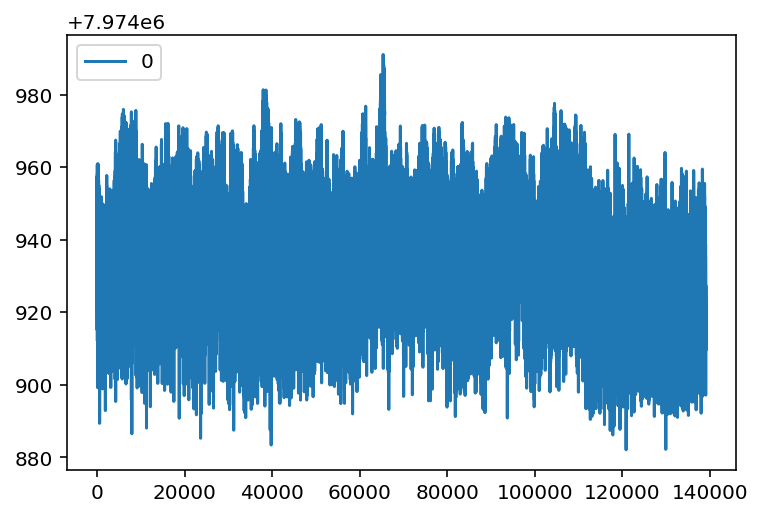

In [17]:
#plot the trace of the likelihood values and amplitude samples to see if its sensible
for j in range(1):
    #plt.figure()
    plt.plot(log_likelihood[j,1_000::1], label=str(j))
    print(np.max(log_likelihood[j,1_000::1]))
    print(np.argmax(log_likelihood[j,1_000::1]))
    
plt.legend(loc=2)

It is also useful to plot the different parameters of the model as a function of iteration number. These so called trace plots can also help diagnose if the run converged properly. Note that some of the plots from the provided samples will show big jumps in these plots. This is due to the fact that these samples were made by combining multiple runs over different frequency ranges together. To assess convergence one would need to look at those runs individually.

/tmp/ipykernel_96038/599206494.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(i)


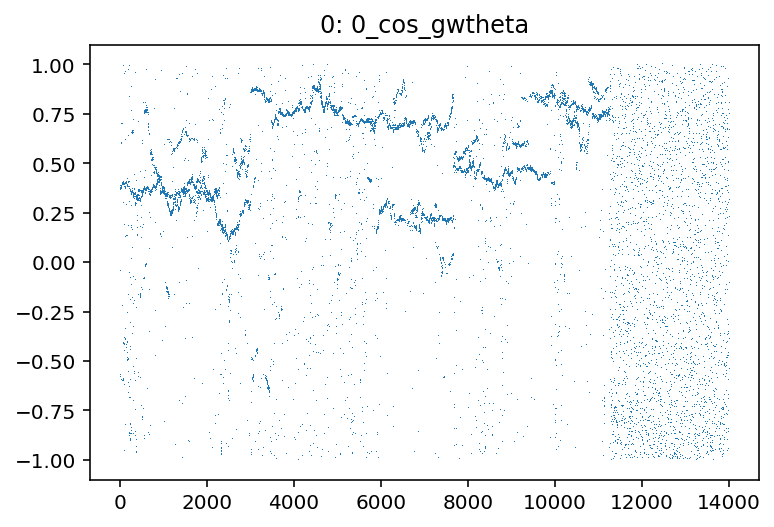

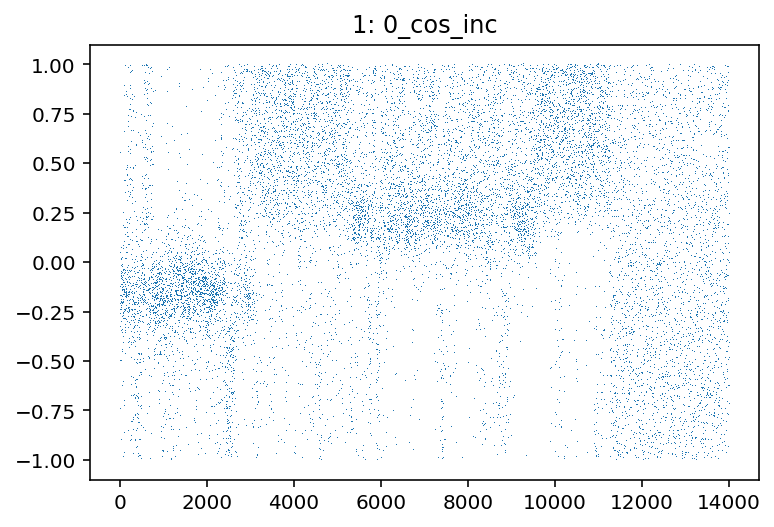

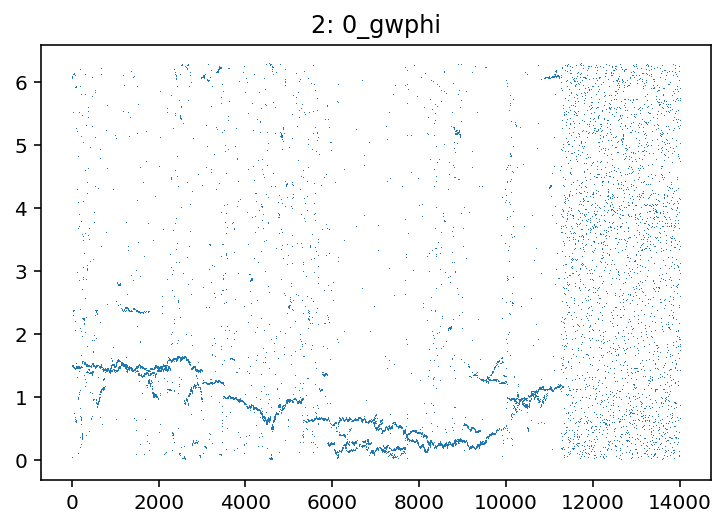

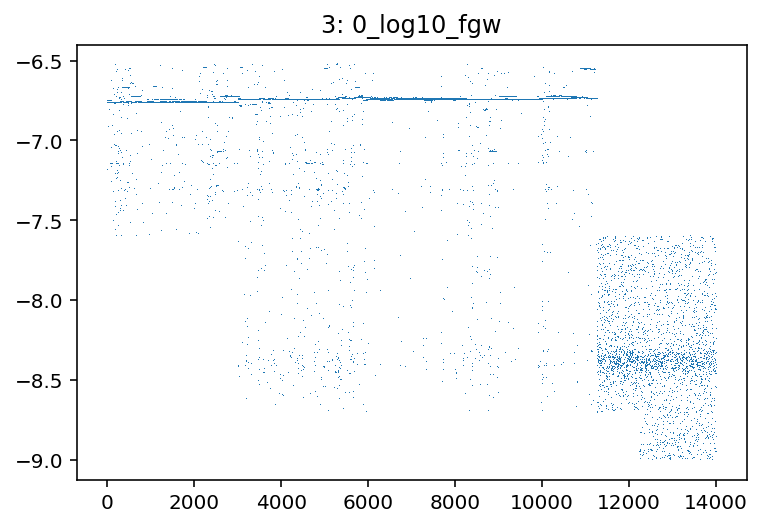

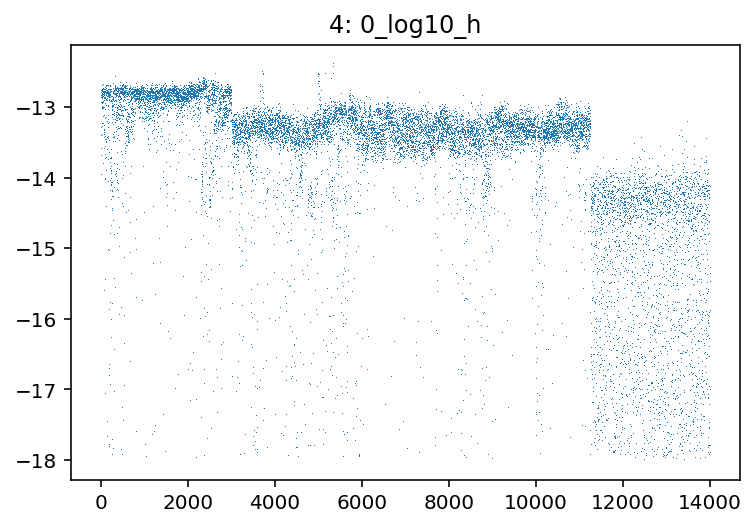

...

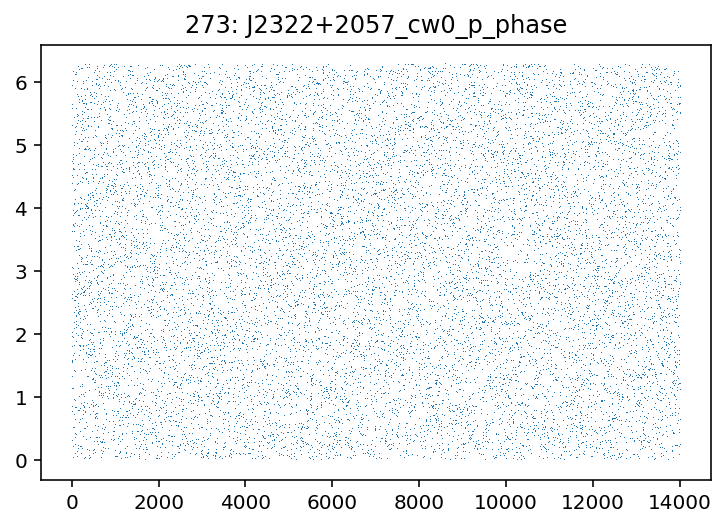

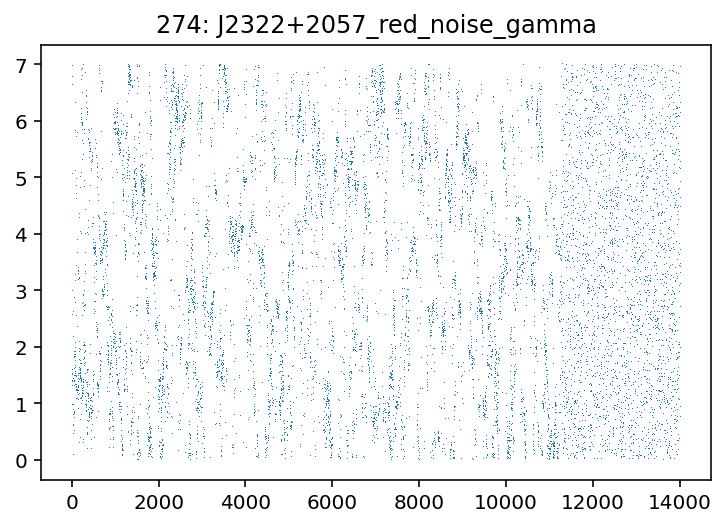

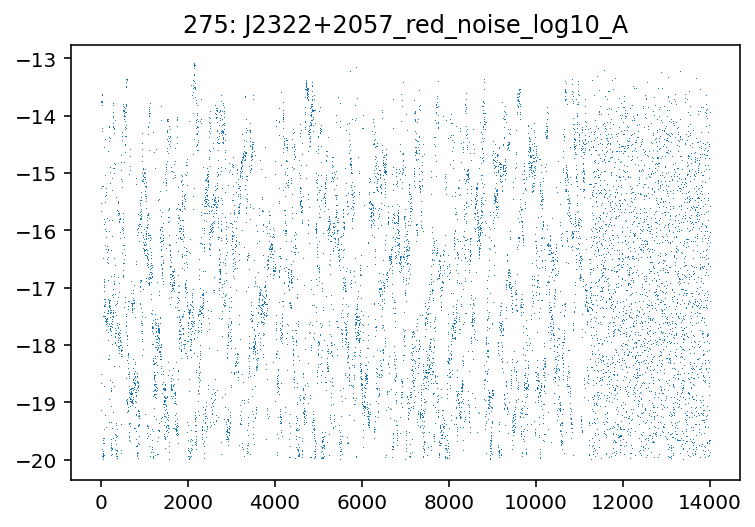

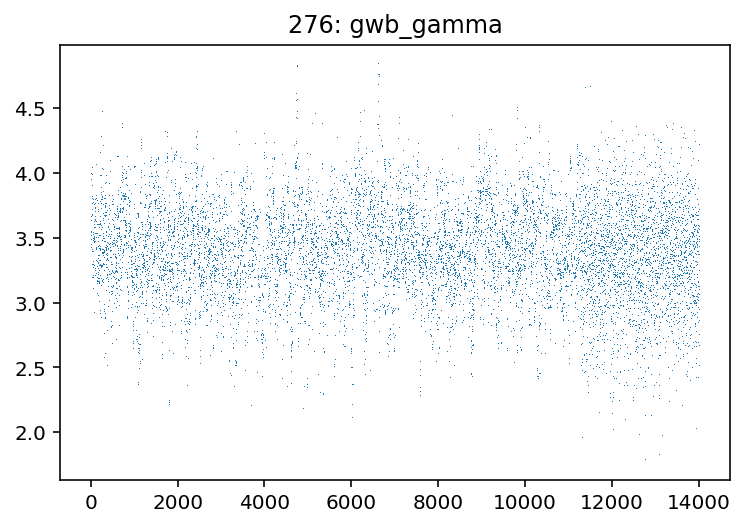

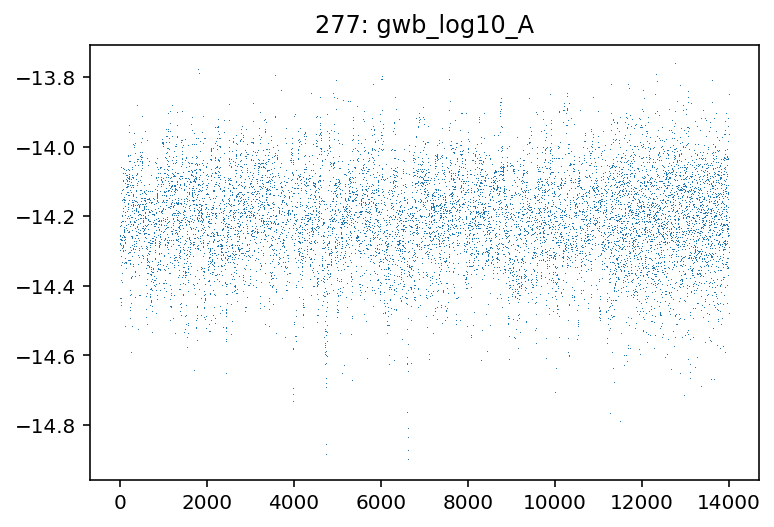

In [18]:
#plot trace of all parameters (useful run diagnostic)
#for the provided runs these might show big jumps
#this is due to the fact that those were made by concatenating multiple runs done on different frequency ranges

burnin = 0
thin = 10

for i, par in enumerate(par_names):
    plt.figure(i)
    plt.plot(samples_cold[burnin::thin,i], ls='', marker=',')
    
    plt.title(str(i) + ": " + par)

The next cell creates a corner plot showing the 1D and 2D marginal distribution of some key parameters.

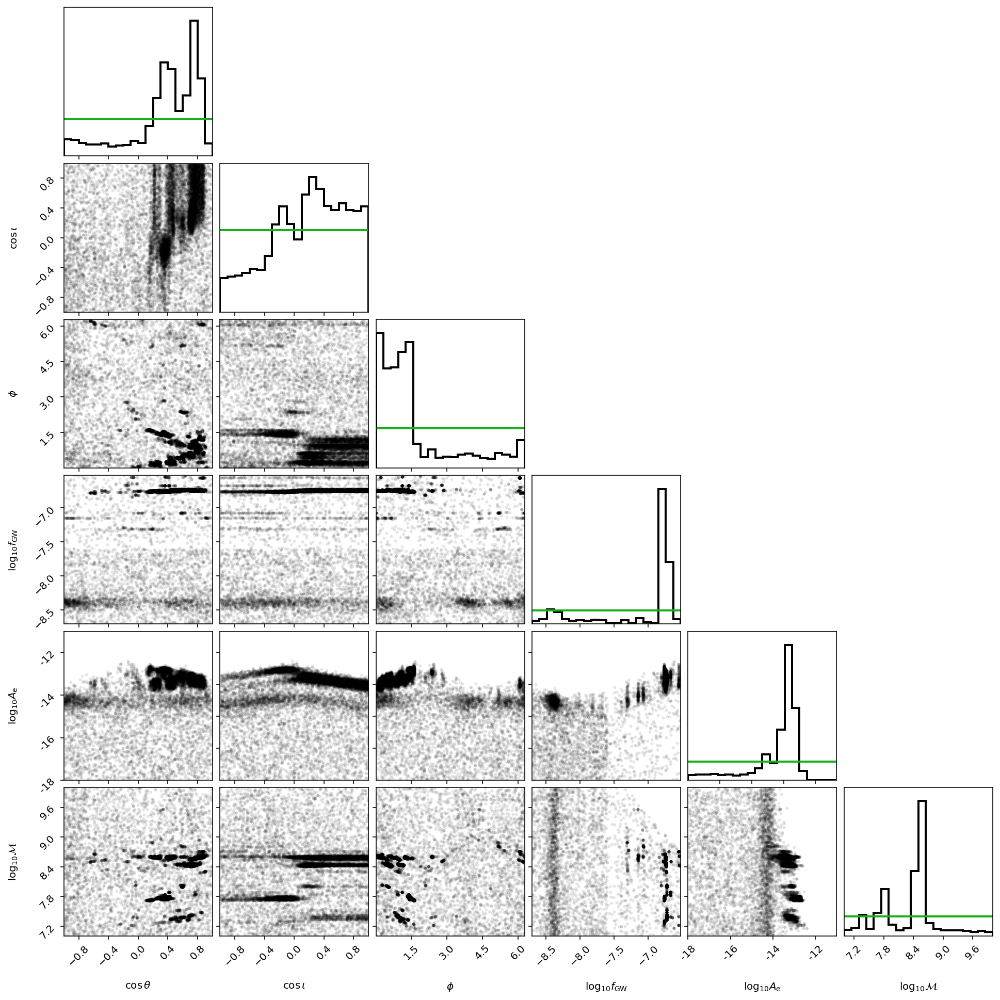

In [19]:
#corner plot of parameters common to all pulsars
corner_mask = [0, 1, 2, 3, 4, 5]#, 6, 7]
corner_mask_reweight = [1, 2, 3, 4, 5, 6]#, 7, 8]
par_keys = ["0_cos_gwtheta", "0_cos_inc", "0_gwphi", "0_log10_fgw",
          "0_log10_h", "0_log10_mc"]#, "0_phase0", "0_psi"]
labels = [r"$\cos \theta$", r"$\cos \iota$", r"$\phi$", r"$\log_{10} f_{\rm GW}$",
          r"$\log_{10} A_{\rm e}$", r"$\log_{10} {\cal M}$"]#, r"$\Phi_0$", r"$\psi$"]


#set ranges
ranges = [(-1,1), (-1,1), (0,2*np.pi), (-8.704,np.log10(3e-7)), (-18,-11), (7,10)]#, (0,2*np.pi), (0,np.pi) ]

#set burnin and thinning
burnin = 0
thin = 10

fig = corner.corner(samples_cold[burnin::thin,corner_mask],
                    labels=labels,# show_titles=True, quantiles=[0.16, 0.5, 0.84],
                    plot_contours=False, plot_density=False, plot_datapoints=True, no_fill_contours=True,
                    data_kwargs={"ms":3},
                    range=ranges, hist_kwargs={"density":True, "lw":2})

#plot priors over 1D posteriors
for i, ax in enumerate(fig.axes):
    if i==0 or i==(len(labels)+1): #cos inc and cos theta
        Xs = np.linspace(-1,1)
        ax.plot(Xs, Xs*0+1/2, color="xkcd:green", lw=2)
    elif i==2*(len(labels)+1) or i==6*(len(labels)+1): #gwphi and phase0
        Xs = np.linspace(0,2*np.pi)
        ax.plot(Xs, Xs*0+1/(2*np.pi), color="xkcd:green", lw=2)
    elif i==3*(len(labels)+1): #log10_fgw
        #Xs = np.linspace(-8.704, -7.0)
        #ax.plot(Xs, Xs*0+1/(-7+8.704), color="xkcd:green")
        Xs = np.linspace(-8.704,np.log10(3e-7))
        ax.plot(Xs, Xs*0+1/(np.log10(3e-7)+8.704), color="xkcd:green", lw=2)
    elif i==4*(len(labels)+1): #log10_A
        Xs = np.linspace(-18, -11)
        ax.plot(Xs, Xs*0+1/7, color="xkcd:green", lw=2)
    elif i==5*(len(labels)+1): #log10_M_ch
        Xs = np.linspace(7, 10)
        ax.plot(Xs, Xs*0+1/3, color="xkcd:green", lw=2)
    elif i==7*(len(labels)+1): #psi
        Xs = np.linspace(0,np.pi)
        ax.plot(Xs, Xs*0+1/np.pi, color="xkcd:green", lw=2)
        
        
for i, ax in enumerate(fig.axes):
    if i==24:
        ax.set_yticks([-18, -16, -14, -12])
        ax.set_yticklabels(["-18", "-16", "-14", "-12"])  
    if i==34:
        ax.set_xticks([-18, -16, -14, -12])
        ax.set_xticklabels(["-18", "-16", "-14", "-12"])  
        
#plt.savefig("Figs/lowf_candidate_corner_v2.pdf")

Next we calculate Bayes factors for the presence of a binary at different frequencies. To do so we bin our samples in frequency, and in each frequency we calculate the Bayes factor with the Savage-Dickey method. This is based on the ratio of the prior and the posterior at the lower prior range of amplitude (effectively zero amplitude). The statistical error of this estimate is calculated from the variance of this ratio in the first few bins.

If the Bayes factor if higher than a given value, we also plot the amplitude historgram in that frequency bin here. This is to visually check if the estimate is robust. Change the if statement to make that plot for any frequency bin.

1e-09 3e-07
4.03198148300279e-09 4.576839342049617e-09


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


[  1.31836735   0.83673469   0.80758017   0.61944778   1.0122449
   0.64489796   0.68783069   0.81161695   0.74489796   1.898931
   2.20784103   3.26594388   1.56650246   1.09647495   0.53061224
   0.59455782   0.63546798   0.83510204   0.60012755   0.5244898
   0.48979592   0.81413994   0.43310658   0.63061224   0.75428571
   0.56760204   0.71428571   0.56235828   0.59863946   1.90306122
   3.35459184   2.94387755   1.53571429   5.39795918   1.77295918
   1.20510204   0.78134111   0.95918367   0.56957328   4.27891156
 220.55102041 212.07482993   5.6180758    1.97959184   9.06122449]
[3.00190933e-01 2.74286890e-01 1.45900334e-01 9.66027368e-02
 1.55382202e-01 1.31114911e-01 1.12828383e-01 1.04216695e-01
 1.21162394e-01 3.80392308e-01 6.79197255e-01 6.73447075e-01
 1.97642051e-01 1.76945530e-01 2.24516641e-01 8.41659700e-02
 1.24513363e-01 7.58747360e-02 1.03374987e-01 6.88414408e-02
 9.39408695e-02 1.59037791e-01 1.36864089e-01 7.42631926e-02
 1.15270361e-01 1.30586447e-01 3.02053037e-

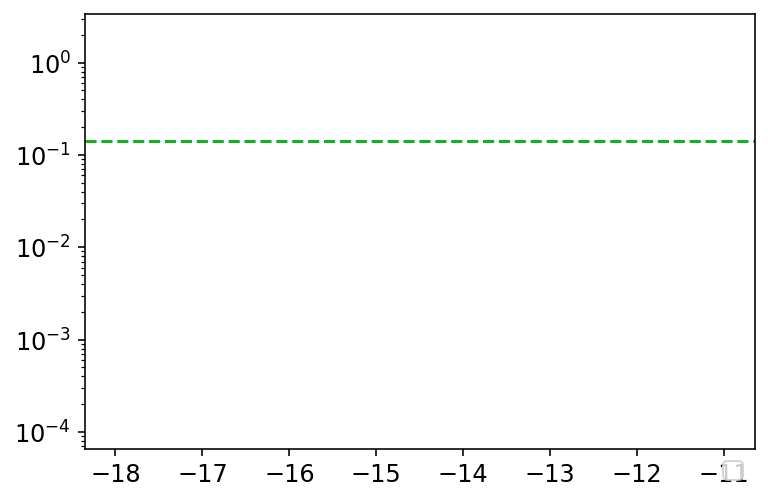

In [22]:
f_min = 1e-9
f_max = 3e-7
print(f_min, f_max)

n_bins = 45#20#50

fbins = np.linspace(np.log10(f_min), np.log10(f_max), n_bins+1)
print(10**fbins[11], 10**fbins[12])

#set burnin and thinning
#burnin = 10_000
burnin = 0
thin = 1

log10_f = samples_cold[burnin::thin,3]
log10_A = samples_cold[burnin::thin,4]

"""n_bins = 50
#fmin = 10**(-8.704)
#fmax = 10**(-7.6)
fmin = -8.704
fmax = -7.6
fbins = np.linspace(fmin, fmax, n_bins+1)
print(fbins)
BFs = np.zeros(n_bins)"""

n_h_bin = 50
n_h_bin4err = 10
bins = np.linspace(-18,-11, n_h_bin)
#bins = np.linspace(-18,-11, 20)
prior_dens = 1/7.0

matplotlib.rcParams.update({'font.size': 12})

BFs = np.zeros(n_bins)
BF_errs = np.zeros(n_bins)
for i in range(n_bins):
    #f_mask = np.where((10**log10_f>fbins[i]) & (10**log10_f<fbins[i+1]))
    f_mask = np.where((log10_f>fbins[i]) & (log10_f<fbins[i+1]))
    hist = plt.hist(log10_A[f_mask], bins=bins, histtype='step', density=True,
                   color='xkcd:black', alpha=0.0)
    BFs[i] = prior_dens/hist[0][0]
    
    #h_autocorr = emcee.autocorr.integrated_time(log10_A[f_mask], c=10, quiet=True)
    #N_eff = np.where((log10_A[f_mask]>bins[0]) &  (log10_A[f_mask]<bins[1]))[0].size/h_autocorr
    #N_eff = log10_A[f_mask].size/h_autocorr
    #N_eff = np.where((log10_A[f_mask]>bins[0]) &  (log10_A[f_mask]<bins[1]))[0].size
    #print(h_autocorr, log10_A[f_mask].size, N_eff)
    #BF_errs[i] = BFs[i]/np.sqrt(N_eff)
    
    BF_errs[i] = np.std(prior_dens/hist[0][:n_h_bin4err])
    
    if BFs[i]>250.0 and BFs[i]<np.inf:
        plt.hist(log10_A[f_mask], bins=bins, histtype='step', density=True,
                 label="{0:.2f} nHz - {1:.2f} nHz: BF={2:.1f}".format(10**fbins[i]*1e9,
                                                                      10**fbins[i+1]*1e9,
                                                                      BFs[i]),
                 alpha=1.0)
        plt.gca().axhline(prior_dens/(BFs[i]+BF_errs[i]))
        plt.gca().axhline(prior_dens/(BFs[i]))
        plt.gca().axhline(prior_dens/(BFs[i]-BF_errs[i]))
        



plt.legend(loc=1, bbox_to_anchor=(1,0))
plt.yscale('log')
plt.gca().axhline(prior_dens, ls='--', color='xkcd:green')
    
print(BFs)  
print(BF_errs)

Finally, we plot the Bayes factors we calculated as a function of frequency. Using the samples provided one should be able to see both the low and high frequency candidates on this plot, albeit with larger statistical errors than reported in the paper (due to the provided samples being thinned to reduce file sizes).

[1.00000000e-09 1.13513402e-09 1.28852924e-09 1.46265337e-09
 1.66030760e-09 1.88467164e-09 2.13935489e-09 2.42845451e-09
 2.75662133e-09 3.12913464e-09 3.55198718e-09 4.03198148e-09
 4.57683934e-09 5.19532603e-09 5.89739132e-09 6.69432950e-09
 7.59896115e-09 8.62583930e-09 9.79148362e-09 1.11146461e-08
 1.26166129e-08 1.43215465e-08 1.62568747e-08 1.84537315e-08
 2.09474584e-08 2.37781726e-08 2.69914126e-08 3.06388706e-08
 3.47792243e-08 3.94790807e-08 4.48140475e-08 5.08699498e-08
 5.77442105e-08 6.55474177e-08 7.44051036e-08 8.44597642e-08
 9.58731516e-08 1.08828876e-07 1.23535359e-07 1.40229188e-07
 1.59178922e-07 1.80689410e-07 2.05106696e-07 2.32823587e-07
 2.64285974e-07 3.00000000e-07]


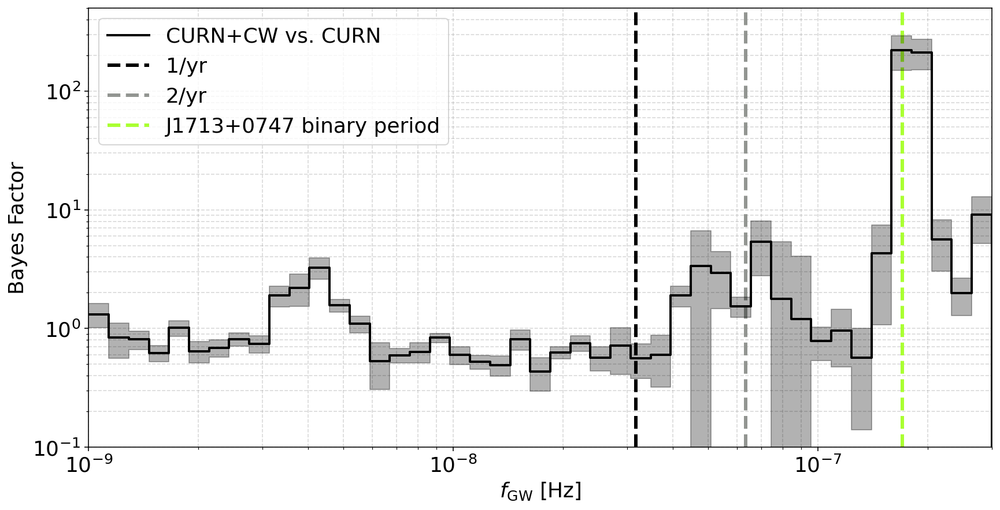

In [23]:
print(10**fbins)
matplotlib.rcParams.update({'font.size': 18})

plt.figure(figsize=(14,7))
plt.step(10**fbins, np.concatenate((BFs, [0.0,])), where='post', lw=2,
         color='xkcd:black', label='CURN+CW vs. CURN', zorder=10)
plt.fill_between(10**fbins,
                 np.concatenate((BFs-BF_errs, [0.0,])),
                 np.concatenate((BFs+BF_errs, [0.0,])),
                 step='post',
                 color='xkcd:black', alpha=0.3, zorder=10)

plt.gca().axvline(1/365.25/86400, ls='--', lw=3, color='xkcd:black', label='1/yr')
plt.gca().axvline(2/365.25/86400, ls='--', lw=3, color='xkcd:gray', label='2/yr')
#plt.gca().axvline(176.3*1e-9, ls='--', color='xkcd:purple', label='176.3 nHz')
plt.gca().axvline(170.6*1e-9, ls='--', lw=3, color='xkcd:lime', label='J1713+0747 binary period')

#plt.ylim(0,4)
#plt.ylim(0,100)
plt.ylim(0.1, 5e2)
plt.yscale("log")
plt.xlim(10**fbins[0], 10**fbins[-1])
plt.xscale('log')

plt.xlabel(r"$f_{\rm GW}$ [Hz]")
#plt.ylabel("CW vs no-CW Bayes Factor")
plt.ylabel("Bayes Factor")
plt.legend(ncol=1)#, bbox_to_anchor=(1,1))

plt.grid(which='both', linestyle='--', alpha=0.5)